# Inspect the single-lineage model run on the colorectal data (009)

 Model attributes:

- sgRNA | gene varying intercept
- RNA and CN varying effects per gene
- correlation between gene varying effects modeled using the multivariate normal and Cholesky decomposition (non-centered parameterization)
- target gene mutation variable and cancer gene comutation variable.
- varying intercept copy number effect for chromosome nested under cell line

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from math import ceil
from time import time

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import Markdown, display
from matplotlib.lines import Line2D

In [3]:
from speclet.analysis.arviz_analysis import extract_coords_param_names
from speclet.bayesian_models.lineage_hierarchical_nb import LineageHierNegBinomModel
from speclet.data_processing.common import head_tail
from speclet.io import modeling_data_dir, models_dir
from speclet.managers.data_managers import CrisprScreenDataManager, broad_only
from speclet.plot import set_speclet_theme
from speclet.project_configuration import arviz_config

In [4]:
# Notebook execution timer.
notebook_tic = time()

# Plotting setup.
set_speclet_theme()
%config InlineBackend.figure_format = "retina"
arviz_config()

## Data

In [5]:
saved_model_dir = models_dir() / "hnb-single-lineage-colorectal-009_PYMC_NUMPYRO"

In [6]:
with open(saved_model_dir / "description.txt") as f:
    model_description = "".join(list(f))

print(model_description)

config. name: 'hnb-single-lineage-colorectal-009'
model name: 'LineageHierNegBinomModel'
model version: '0.1.3'
model description: A hierarchical negative binomial generalized linear model for one lineage.
fit method: 'PYMC_NUMPYRO'

--------------------------------------------------------------------------------

CONFIGURATION

{
    "name": "hnb-single-lineage-colorectal-009",
    "description": " Single lineage hierarchical negative binomial model for colorectal data from the Broad. Varying effects for each chromosome of each cell line has been nested under the existing varying effects for cell line. ",
    "active": true,
    "model": "LINEAGE_HIERARCHICAL_NB",
    "data_file": "modeling_data/lineage-modeling-data/depmap-modeling-data_colorectal.csv",
    "model_kwargs": {
        "lineage": "colorectal",
        "min_frac_cancer_genes": 0.2
    },
    "sampling_kwargs": {
        "pymc_mcmc": null,
        "pymc_advi": null,
        "pymc_numpyro": {
            "draws": 1000,
   

### Load posterior summary

In [7]:
crc_post_summary = pd.read_csv(saved_model_dir / "posterior-summary.csv").assign(
    var_name=lambda d: [x.split("[")[0] for x in d["parameter"]]
)
crc_post_summary.head()

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
0,mu_mu_a,0.090,0.004,0.084,0.096,0.000,0.000,344.0,578.0,1.02,mu_mu_a
1,mu_b,-0.001,0.000,-0.001,-0.000,0.000,0.000,3297.0,3353.0,1.00,mu_b
2,mu_mu_m,-0.184,0.025,-0.226,-0.146,0.001,0.001,606.0,1205.0,1.01,mu_mu_m
3,sigma_a,0.183,0.001,0.182,0.184,0.000,0.000,994.0,1990.0,1.00,sigma_a
4,sigma_k,0.031,0.001,0.029,0.032,0.000,0.000,1059.0,1950.0,1.00,sigma_k


### Load trace object

In [8]:
trace_file = saved_model_dir / "posterior.netcdf"
assert trace_file.exists()
trace = az.from_netcdf(trace_file)

### CRC data

In [9]:
crc_dm = CrisprScreenDataManager(
    modeling_data_dir()
    / "lineage-modeling-data"
    / "depmap-modeling-data_colorectal.csv",
    transformations=[broad_only],
)

In [10]:
crc_data = crc_dm.get_data(read_kwargs={"low_memory": False})
crc_data.head()

,sgrna,replicate_id,lfc,p_dna_batch,genome_alignment,hugo_symbol,screen,multiple_hits_on_gene,sgrna_target_chr,sgrna_target_pos,...,any_deleterious,any_tcga_hotspot,any_cosmic_hotspot,is_mutated,copy_number,lineage,lineage_subtype,primary_or_metastasis,is_male,age
0,AAAGCCCAGGAGTATGGGAG,LS513-311Cas9_RepA_p6_batch2,0.594321,2,chr2_130522105_-,CFC1B,broad,True,2,130522105,...,NaN,NaN,NaN,False,0.951337,colorectal,colorectal_adenocarcinoma,primary,True,63.0
1,AAATCAGAGAAACCTGAACG,LS513-311Cas9_RepA_p6_batch2,-0.363633,2,chr11_89916950_-,TRIM49D1,broad,True,11,89916950,...,NaN,NaN,NaN,False,0.945508,colorectal,colorectal_adenocarcinoma,primary,True,63.0
2,AACGTCTTTGAAGAAAGCTG,LS513-311Cas9_RepA_p6_batch2,-0.001343,2,chr5_71055421_-,GTF2H2,broad,True,5,71055421,...,NaN,NaN,NaN,False,1.428663,colorectal,colorectal_adenocarcinoma,primary,True,63.0
3,AACGTCTTTGAAGGAAGCTG,LS513-311Cas9_RepA_p6_batch2,0.367220,2,chr5_69572480_+,GTF2H2C,broad,True,5,69572480,...,NaN,NaN,NaN,False,1.428663,colorectal,colorectal_adenocarcinoma,primary,True,63.0
4,AAGAGGTTCCAGACTACTTA,LS513-311Cas9_RepA_p6_batch2,-1.180029,2,chrX_155898173_+,VAMP7,broad,True,X,155898173,...,NaN,NaN,NaN,False,0.466222,colorectal,colorectal_adenocarcinoma,primary,True,63.0


### Single lineage model

In [11]:
crc_model = LineageHierNegBinomModel(lineage="colorectal", min_frac_cancer_genes=0.2)

In [12]:
valid_crc_data = crc_model.data_processing_pipeline(crc_data.copy())
crc_mdl_data = crc_model.make_data_structure(valid_crc_data)

[INFO] 2022-08-11 06:14:09 [(lineage_hierarchical_nb.py:data_processing_pipeline:329] Processing data for modeling.
[INFO] 2022-08-11 06:14:09 [(lineage_hierarchical_nb.py:data_processing_pipeline:330] LFC limits: (-5.0, 5.0)
[WARNING] 2022-08-11 06:15:58 [(lineage_hierarchical_nb.py:data_processing_pipeline:388] number of data points dropped: 25
[INFO] 2022-08-11 06:16:00 [(lineage_hierarchical_nb.py:target_gene_is_mutated_vector:627] number of genes mutated in all cells lines: 0
[DEBUG] 2022-08-11 06:16:00 [(lineage_hierarchical_nb.py:target_gene_is_mutated_vector:630] Genes always mutated: 
[DEBUG] 2022-08-11 06:16:03 [(cancer_gene_mutation_matrix.py:_trim_cancer_genes:68] all_mut: {}
[INFO] 2022-08-11 06:16:04 [(cancer_gene_mutation_matrix.py:_trim_cancer_genes:77] Dropping 21 cancer genes.
[DEBUG] 2022-08-11 06:16:04 [(cancer_gene_mutation_matrix.py:_trim_cancer_genes:79] Dropped cancer genes: ['AKT1', 'AXIN1', 'BAX', 'ERBB3', 'GRIN2A', 'HIF1A', 'MAP2K1', 'MAX', 'MDM2', 'MLH1', 'M

In [13]:
crc_mdl_data.coords["cancer_gene"]

['APC', 'AXIN2', 'B2M', 'FBXW7', 'KRAS', 'MSH6', 'PIK3CA', 'POLD1', 'UBR5']

## Analysis

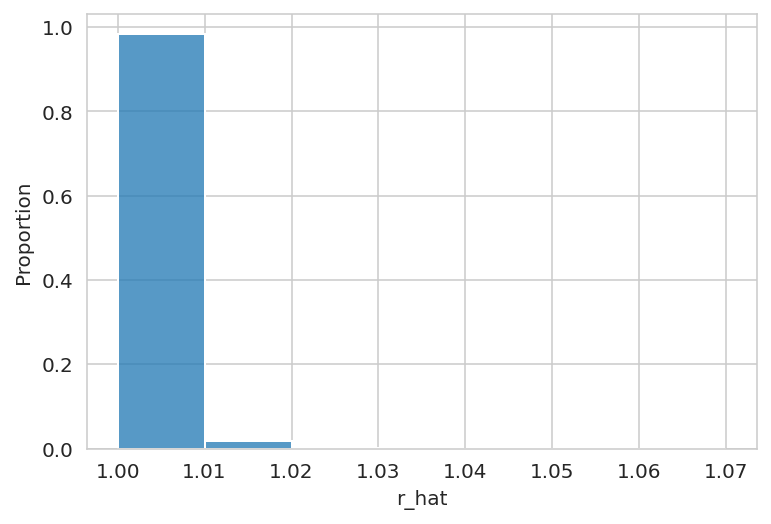

In [14]:
sns.histplot(x=crc_post_summary["r_hat"], binwidth=0.01, stat="proportion");

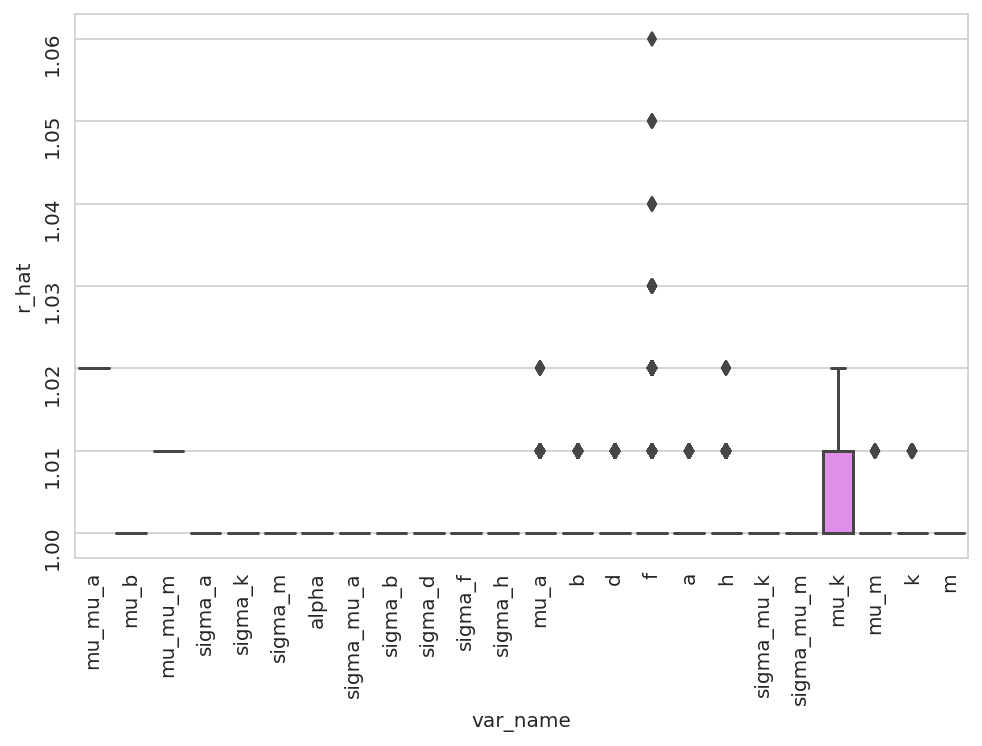

In [15]:
fig, ax = plt.subplots(figsize=(8, 5))
sns.boxplot(data=crc_post_summary, x="var_name", y="r_hat", ax=ax)
ax.tick_params(rotation=90)
plt.show()

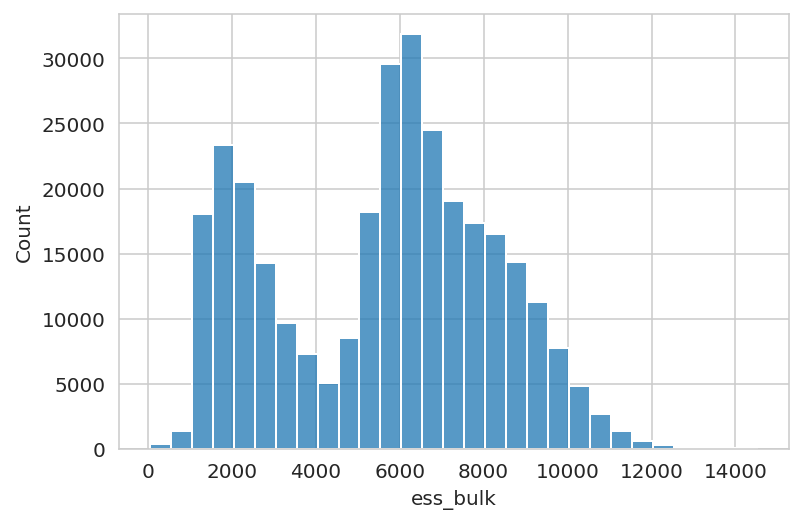

In [16]:
sns.histplot(data=crc_post_summary, x="ess_bulk", binwidth=500);

In [18]:
crc_post_summary.query("ess_bulk < 400 and ess_tail < 400")

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name


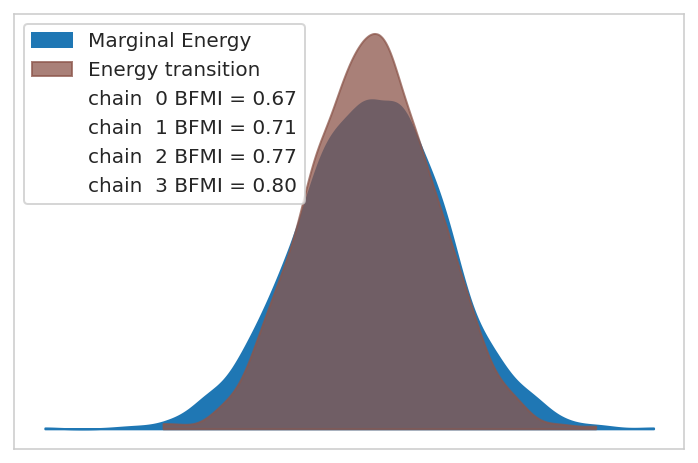

In [19]:
az.plot_energy(trace);

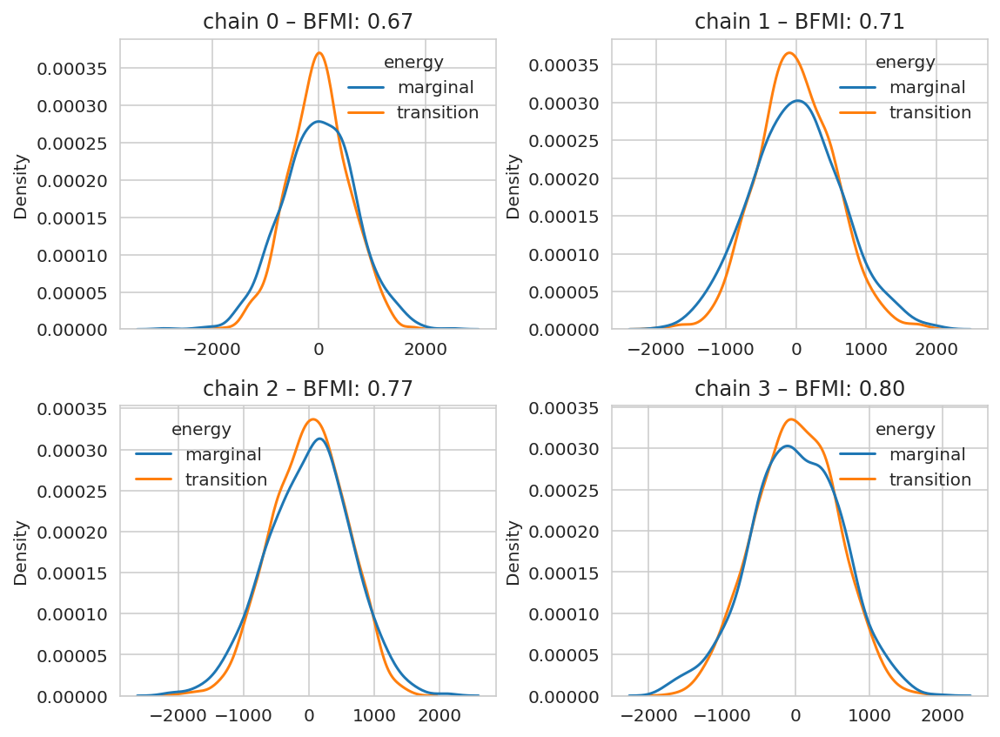

In [20]:
energy = trace.sample_stats.energy.values
marginal_e = pd.DataFrame((energy - energy.mean(axis=1)[:, None]).T).assign(
    energy="marginal"
)
transition_e = pd.DataFrame((energy[:, :-1] - energy[:, 1:]).T).assign(
    energy="transition"
)
energy_df = pd.concat([marginal_e, transition_e]).reset_index(drop=True)
bfmi = az.bfmi(trace)

fig, axes = plt.subplots(2, 2, figsize=(8, 6))
for i, ax in enumerate(axes.flatten()):
    sns.kdeplot(data=energy_df, x=i, hue="energy", ax=ax)
    ax.set_title(f"chain {i} – BFMI: {bfmi[i]:0.2f}")
    ax.set_xlabel(None)
    xmin, _ = ax.get_xlim()
    _, ymax = ax.get_ylim()
    ax.get_legend().set_frame_on(False)

fig.tight_layout()
plt.show()

In [21]:
stats = ["step_size", "n_steps", "tree_depth", "acceptance_rate", "energy"]
trace.sample_stats.get(stats).to_dataframe().groupby("chain").mean()

,step_size,n_steps,tree_depth,acceptance_rate,energy
chain,,,,,
0,0.008000,511.0,9.0,0.989615,1.910692e+07
1,0.010022,511.0,9.0,0.984676,1.910693e+07
2,0.008725,511.0,9.0,0.988467,1.910689e+07
3,0.004137,1023.0,10.0,0.992916,1.910687e+07


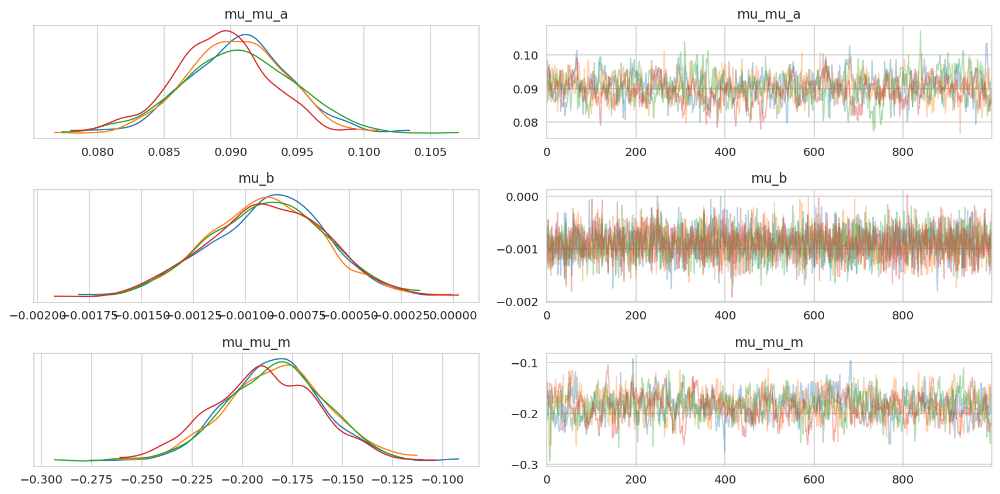

In [22]:
az.plot_trace(trace, var_names=["mu_mu_a", "mu_b", "mu_mu_m"], compact=False)
plt.tight_layout()

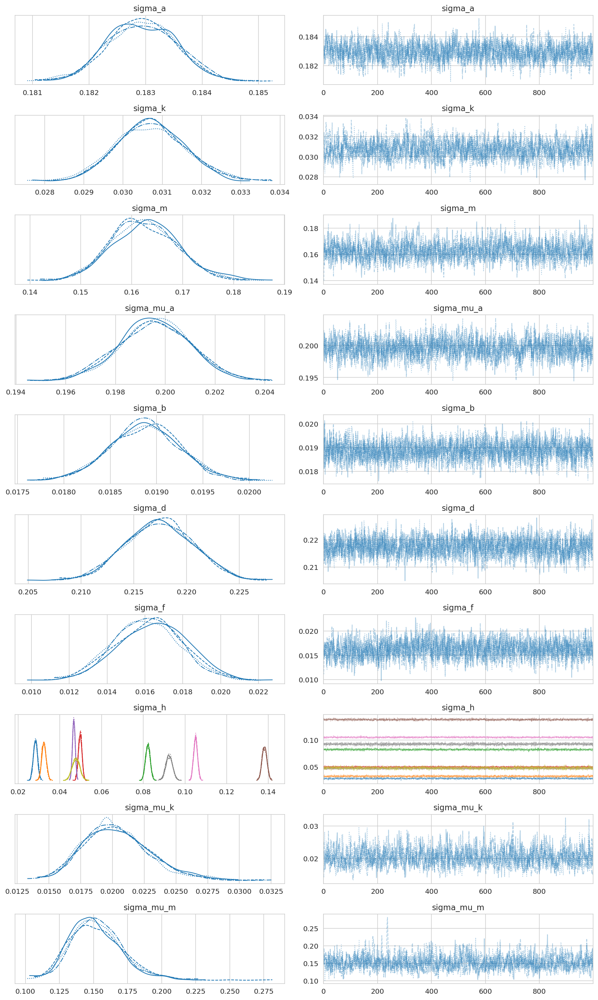

In [24]:
az.plot_trace(trace, var_names=["^sigma_*"], filter_vars="regex", compact=True)
plt.tight_layout()

In [25]:
az.summary(trace, var_names=["^sigma_.*$"], filter_vars="regex")

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma_a,0.183,0.001,0.182,0.184,0.000,0.0,994.0,1990.0,1.0
sigma_k,0.031,0.001,0.029,0.032,0.000,0.0,1059.0,1950.0,1.0
sigma_m,0.163,0.007,0.152,0.173,0.000,0.0,1124.0,1546.0,1.0
sigma_mu_a,0.200,0.001,0.197,0.202,0.000,0.0,988.0,1696.0,1.0
sigma_b,0.019,0.000,0.018,0.019,0.000,0.0,1539.0,2329.0,1.0
sigma_d,0.217,0.003,0.212,0.222,0.000,0.0,1223.0,2639.0,1.0
sigma_f,0.016,0.002,0.013,0.019,0.000,0.0,1478.0,2563.0,1.0
sigma_h[APC],0.028,0.001,0.027,0.030,0.000,0.0,1243.0,2082.0,1.0
sigma_h[AXIN2],0.032,0.001,0.031,0.034,0.000,0.0,1932.0,2965.0,1.0
sigma_h[B2M],0.082,0.001,0.080,0.084,0.000,0.0,1819.0,2877.0,1.0


In [26]:
sigmas = ["sigma_mu_a", "sigma_b", "sigma_d", "sigma_f", "sigma_k"]
trace.posterior.get(sigmas).mean(dim="draw").to_dataframe()

,sigma_mu_a,sigma_b,sigma_d,sigma_f,sigma_k
chain,,,,,
0,0.199535,0.018873,0.217379,0.016489,0.030676
1,0.199652,0.018876,0.217482,0.016022,0.030665
2,0.199614,0.018891,0.217424,0.016242,0.030736
3,0.199555,0.018858,0.217409,0.016153,0.030736


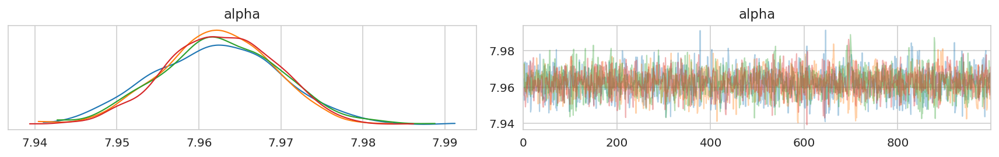

In [27]:
az.plot_trace(trace, var_names=["alpha"], compact=False)
plt.tight_layout()

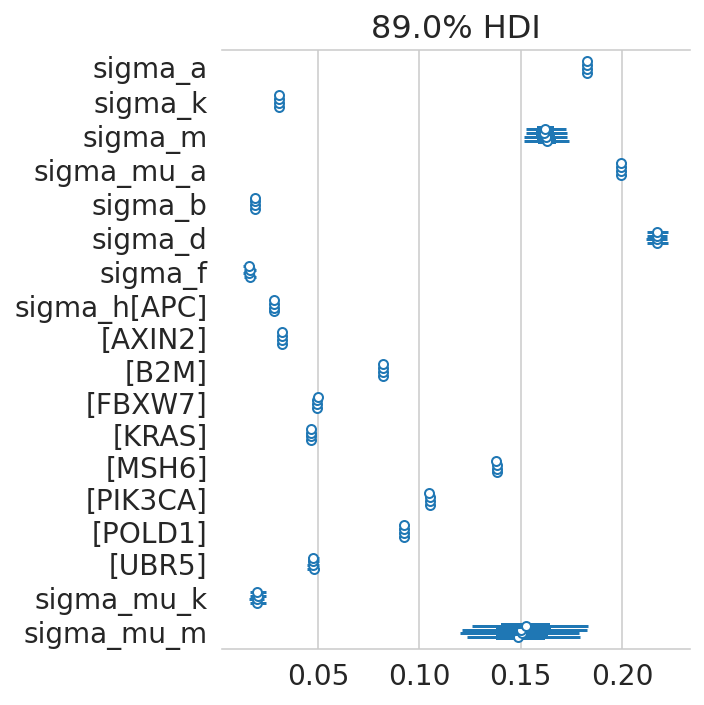

In [28]:
az.plot_forest(
    trace, var_names=["^sigma_*"], filter_vars="regex", combined=False, figsize=(5, 5)
)
plt.tight_layout()

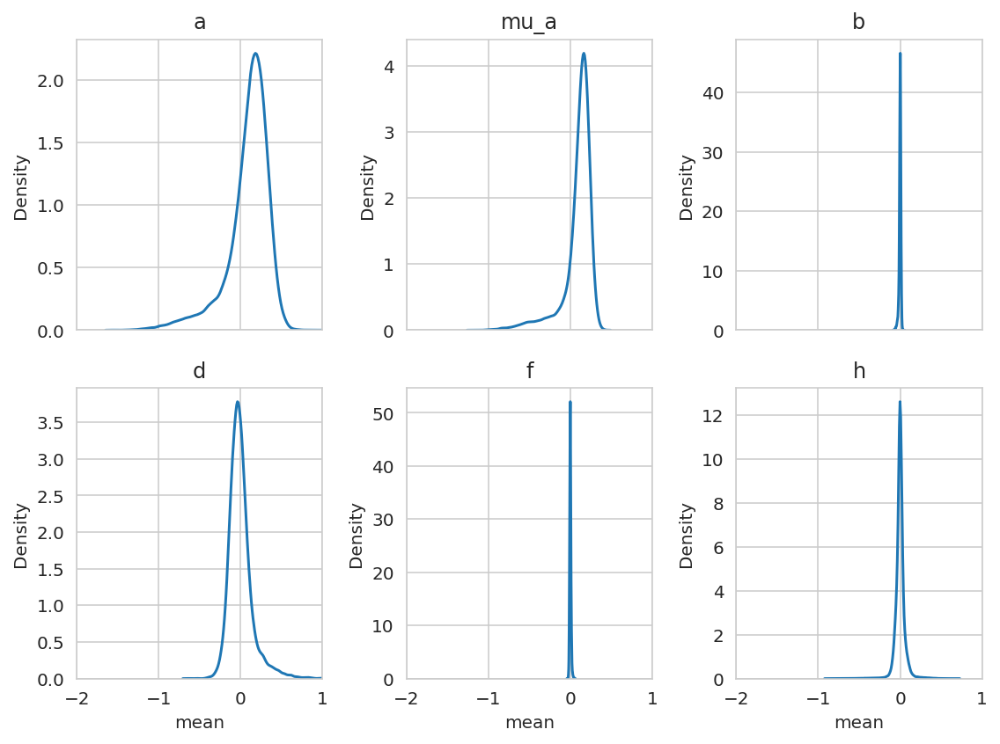

In [29]:
var_names = ["a", "mu_a", "b", "d", "f", "h"]
_, axes = plt.subplots(2, 3, figsize=(8, 6), sharex=True)
for ax, var_name in zip(axes.flatten(), var_names):
    x = crc_post_summary.query(f"var_name == '{var_name}'")["mean"]
    sns.kdeplot(x=x, ax=ax)
    ax.set_title(var_name)
    ax.set_xlim(-2, 1)

plt.tight_layout()
plt.show()

In [30]:
sgrna_to_gene_map = (
    crc_data.copy()[["hugo_symbol", "sgrna"]].drop_duplicates().reset_index(drop=True)
)

In [31]:
for v in ["mu_a", "b", "d", "f", "h", "k", "m"]:
    display(Markdown(f"variable: **{v}**"))
    top = (
        crc_post_summary.query(f"var_name == '{v}'")
        .sort_values("mean")
        .pipe(head_tail, 5)
    )
    display(top)

variable: **mu_a**

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
12662,mu_a[RAN],-1.182,0.074,-1.305,-1.069,0.002,0.001,2085.0,2795.0,1.0,mu_a
12334,mu_a[PSMD7],-1.045,0.078,-1.167,-0.920,0.002,0.001,2327.0,2711.0,1.0,mu_a
11851,mu_a[POLR2L],-1.029,0.075,-1.145,-0.905,0.002,0.001,2279.0,2894.0,1.0,mu_a
13324,mu_a[RPSA],-1.025,0.074,-1.141,-0.908,0.002,0.001,1957.0,2750.0,1.0,mu_a
7794,mu_a[KIF11],-1.023,0.076,-1.136,-0.891,0.002,0.001,2114.0,2531.0,1.0,mu_a
16409,mu_a[TRIQK],0.390,0.076,0.268,0.510,0.002,0.001,1529.0,2075.0,1.0,mu_a
3838,mu_a[DAB2IP],0.394,0.075,0.276,0.512,0.002,0.001,1343.0,1617.0,1.0,mu_a
13179,mu_a[ROCK2],0.394,0.077,0.273,0.522,0.002,0.002,1167.0,1813.0,1.0,mu_a
8821,mu_a[MAPK9],0.407,0.084,0.275,0.541,0.002,0.002,1495.0,2360.0,1.0,mu_a
17907,mu_a[ZNF611],0.412,0.072,0.297,0.525,0.002,0.001,1737.0,2207.0,1.0,mu_a


variable: **b**

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
31286,b[RNGTT],-0.085,0.015,-0.108,-0.060,0.0,0.0,5630.0,2761.0,1.0,b
18808,b[ANKLE2],-0.080,0.014,-0.104,-0.058,0.0,0.0,6631.0,2840.0,1.0,b
30885,b[RBM22],-0.079,0.015,-0.103,-0.055,0.0,0.0,6820.0,3305.0,1.0,b
30421,b[PSMA6],-0.076,0.015,-0.099,-0.052,0.0,0.0,8107.0,2756.0,1.0,b
31945,b[SF1],-0.072,0.014,-0.094,-0.049,0.0,0.0,5565.0,2923.0,1.0,b
24040,b[GET4],0.034,0.015,0.011,0.059,0.0,0.0,6545.0,3058.0,1.0,b
33739,b[TGFB1],0.035,0.014,0.013,0.058,0.0,0.0,8724.0,3118.0,1.0,b
18750,b[AMIGO2],0.040,0.014,0.018,0.063,0.0,0.0,7791.0,2925.0,1.0,b
20821,b[CDKN1C],0.043,0.015,0.020,0.067,0.0,0.0,8461.0,2371.0,1.0,b
20819,b[CDKN1A],0.053,0.014,0.030,0.075,0.0,0.0,7400.0,2915.0,1.0,b


variable: **d**

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
50220,d[SIK3],-0.643,0.149,-0.885,-0.403,0.002,0.001,6385.0,2872.0,1.00,d
38696,d[CCND1],-0.613,0.157,-0.876,-0.377,0.002,0.001,5985.0,2781.0,1.01,d
41089,d[ERBB2],-0.535,0.163,-0.788,-0.271,0.002,0.002,6651.0,2954.0,1.00,d
48549,d[PSMB5],-0.534,0.166,-0.796,-0.269,0.003,0.002,4051.0,2865.0,1.00,d
40046,d[CYP4F11],-0.431,0.152,-0.691,-0.205,0.002,0.001,7046.0,2631.0,1.00,d
39250,d[CIAO3],0.983,0.149,0.749,1.220,0.002,0.001,6702.0,2896.0,1.00,d
53246,d[VCP],0.992,0.165,0.701,1.231,0.002,0.002,6143.0,2574.0,1.00,d
50766,d[SMU1],0.993,0.163,0.724,1.239,0.002,0.002,5133.0,3011.0,1.00,d
42216,d[GINS2],1.014,0.170,0.750,1.287,0.002,0.002,6242.0,2990.0,1.00,d
47945,d[PLK1],1.216,0.176,0.945,1.502,0.002,0.002,5677.0,2910.0,1.00,d


variable: **f**

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
63996,f[MYH9],-0.039,0.015,-0.063,-0.016,0.000,0.000,1353.0,2688.0,1.01,f
55741,f[BAG3],-0.036,0.014,-0.059,-0.013,0.000,0.000,1109.0,2860.0,1.01,f
68416,f[SLC13A4],-0.034,0.014,-0.056,-0.012,0.000,0.000,2659.0,2838.0,1.00,f
62331,f[KRAS],-0.034,0.017,-0.059,-0.007,0.001,0.001,515.0,2735.0,1.01,f
67261,f[RFFL],-0.029,0.014,-0.052,-0.008,0.000,0.000,2375.0,2571.0,1.00,f
58201,f[DAD1],0.051,0.016,0.025,0.075,0.001,0.000,839.0,2691.0,1.01,f
68932,f[SNRPD1],0.051,0.016,0.026,0.076,0.000,0.000,2009.0,3190.0,1.01,f
69278,f[SS18L2],0.053,0.016,0.031,0.080,0.000,0.000,3236.0,2603.0,1.00,f
56041,f[BUB3],0.053,0.016,0.027,0.078,0.000,0.000,4769.0,3114.0,1.00,f
71021,f[TXNL4A],0.058,0.017,0.030,0.084,0.001,0.000,1104.0,2926.0,1.01,f


variable: **h**

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
257341,"h[RAN, MSH6]",-0.904,0.052,-0.981,-0.816,0.001,0.001,2149.0,2975.0,1.0,h
182236,"h[DONSON, MSH6]",-0.819,0.053,-0.907,-0.738,0.001,0.001,2139.0,2780.0,1.0,h
263299,"h[RPSA, MSH6]",-0.813,0.052,-0.894,-0.731,0.001,0.001,1986.0,2675.0,1.0,h
250042,"h[POLR2L, MSH6]",-0.804,0.053,-0.885,-0.719,0.001,0.001,2464.0,3011.0,1.0,h
254389,"h[PSMD7, MSH6]",-0.795,0.054,-0.883,-0.711,0.001,0.001,2438.0,2637.0,1.0,h
213530,"h[KIF11, PIK3CA]",0.605,0.045,0.531,0.677,0.001,0.001,3089.0,2939.0,1.0,h
182237,"h[DONSON, PIK3CA]",0.609,0.045,0.538,0.681,0.001,0.001,3111.0,3042.0,1.0,h
263300,"h[RPSA, PIK3CA]",0.612,0.043,0.544,0.681,0.001,0.001,2850.0,2891.0,1.0,h
250043,"h[POLR2L, PIK3CA]",0.622,0.044,0.554,0.690,0.001,0.001,3221.0,2932.0,1.0,h
257342,"h[RAN, PIK3CA]",0.711,0.045,0.645,0.787,0.001,0.001,2979.0,3242.0,1.0,h


variable: **k**

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
307509,k[ACH-001460__17],-0.175,0.009,-0.188,-0.161,0.0,0.0,1190.0,2286.0,1.00,k
307102,k[ACH-000683__1],-0.168,0.008,-0.180,-0.155,0.0,0.0,810.0,1547.0,1.01,k
307508,k[ACH-001460__16],-0.136,0.018,-0.165,-0.106,0.0,0.0,2500.0,3015.0,1.00,k
307578,k[ACH-002023__17],-0.130,0.008,-0.143,-0.117,0.0,0.0,1438.0,2194.0,1.00,k
307250,k[ACH-000957__11],-0.116,0.007,-0.128,-0.105,0.0,0.0,1242.0,2602.0,1.00,k
306906,k[ACH-000381__12],0.094,0.013,0.073,0.114,0.0,0.0,3099.0,2886.0,1.00,k
307568,k[ACH-002023__7],0.094,0.009,0.078,0.108,0.0,0.0,1706.0,2707.0,1.00,k
307427,k[ACH-001454__4],0.097,0.009,0.083,0.111,0.0,0.0,1489.0,2386.0,1.00,k
306753,k[ACH-000009__20],0.099,0.015,0.074,0.122,0.0,0.0,2604.0,3032.0,1.00,k
307565,k[ACH-002023__4],0.137,0.009,0.124,0.151,0.0,0.0,1616.0,2853.0,1.00,k


variable: **m**

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
308360,m[ACH-001454__17],-1.313,0.058,-1.412,-1.225,0.001,0.001,4554.0,2817.0,1.0,m
307991,m[ACH-000651__16],-1.274,0.034,-1.330,-1.222,0.000,0.000,4995.0,3783.0,1.0,m
308345,m[ACH-001454__2],-1.107,0.046,-1.181,-1.036,0.001,0.000,5357.0,2661.0,1.0,m
308354,m[ACH-001454__11],-1.050,0.033,-1.106,-1.000,0.000,0.000,5683.0,3329.0,1.0,m
308357,m[ACH-001454__14],-1.015,0.098,-1.173,-0.862,0.002,0.001,3655.0,2527.0,1.0,m
307779,m[ACH-000296__11],0.187,0.132,-0.024,0.395,0.002,0.001,6623.0,2838.0,1.0,m
308486,m[ACH-002023__5],0.188,0.050,0.109,0.266,0.001,0.000,5230.0,3358.0,1.0,m
307775,m[ACH-000296__7],0.200,0.073,0.086,0.318,0.001,0.001,7100.0,3062.0,1.0,m
307783,m[ACH-000296__15],0.228,0.126,0.030,0.430,0.003,0.002,2264.0,2287.0,1.0,m
308482,m[ACH-002023__1],0.361,0.041,0.297,0.430,0.001,0.000,6699.0,3580.0,1.0,m


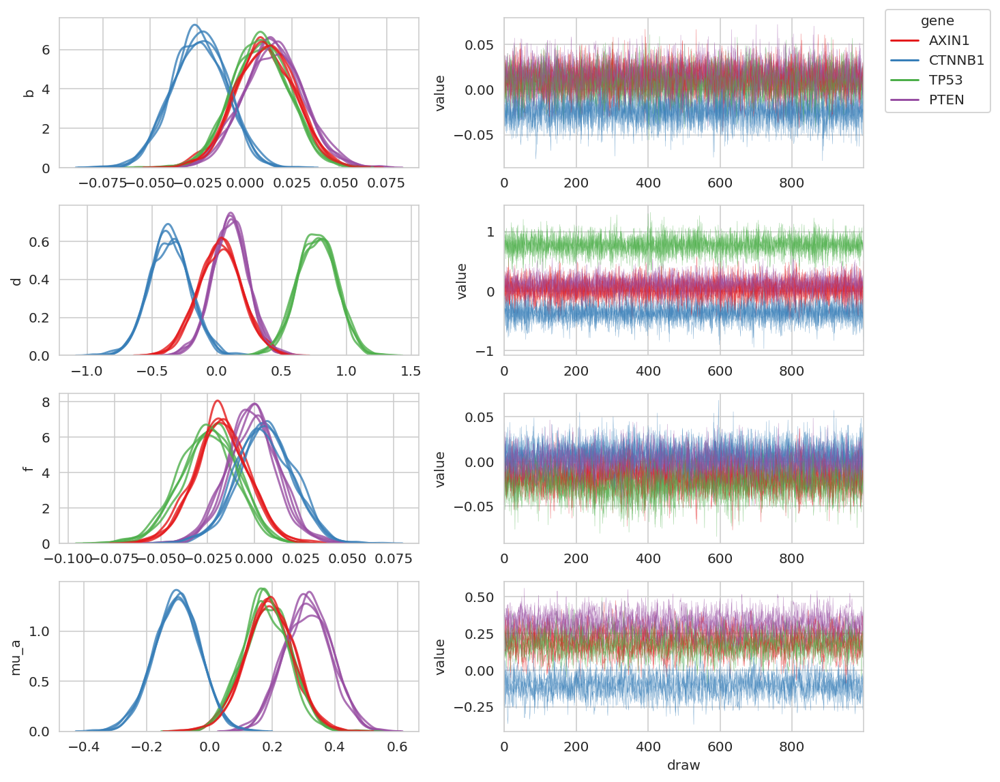

In [33]:
varnames = ["mu_a", "b", "d", "f"]
example_genes = ["AXIN1", "CTNNB1", "TP53", "PTEN"]
gene_effects_post = trace.posterior.get(varnames).sel(gene=example_genes).to_dataframe()

plot_df = (
    gene_effects_post.reset_index(drop=False)
    .pivot_longer(
        index=["chain", "draw", "gene"], names_to="var_name", values_to="value"
    )
    .astype({"chain": "category"})
)

fig, axes = plt.subplots(len(varnames), 2, figsize=(9, len(varnames) * 2))
gene_pal = {
    g: c for g, c in zip(example_genes, sns.mpl_palette("Set1", len(example_genes)))
}

for i, (var_name, data_v) in enumerate(plot_df.groupby("var_name")):
    for c, data_c in data_v.groupby("chain"):
        sns.kdeplot(
            data=data_c,
            x="value",
            hue="gene",
            palette=gene_pal,
            fill=False,
            ax=axes[i, 0],
            alpha=0.8,
        )
        axes[i, 0].set_xlabel(None)
        axes[i, 0].set_ylabel(var_name)
        sns.lineplot(
            data=data_c,
            x="draw",
            y="value",
            hue="gene",
            palette=gene_pal,
            ax=axes[i, 1],
            alpha=0.6,
            lw=0.25,
        )
        axes[i, 1].set_xlim(0, data_c["draw"].max())
        axes[i, 1].set_xlabel(None)

axes[-1, 1].set_xlabel("draw")
for ax in axes.flatten():
    if (leg := ax.get_legend()) is not None:
        leg.remove()

leg_handles = []
for g, c in gene_pal.items():
    leg_handles.append(Line2D([0], [0], color=c, label=g))
fig.legend(handles=leg_handles, title="gene", loc="upper left", bbox_to_anchor=(1, 1))

fig.tight_layout()
plt.show()

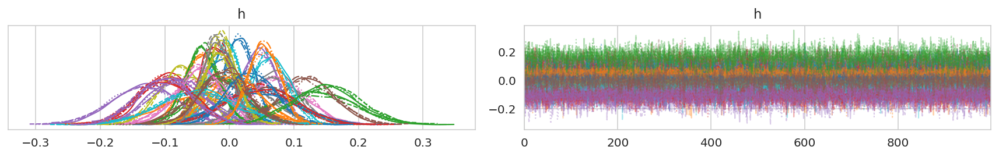

In [34]:
az.plot_trace(
    trace,
    var_names=["h"],
    coords={"gene": example_genes},
    compact=True,
    legend=False,
)
plt.tight_layout()
plt.show()

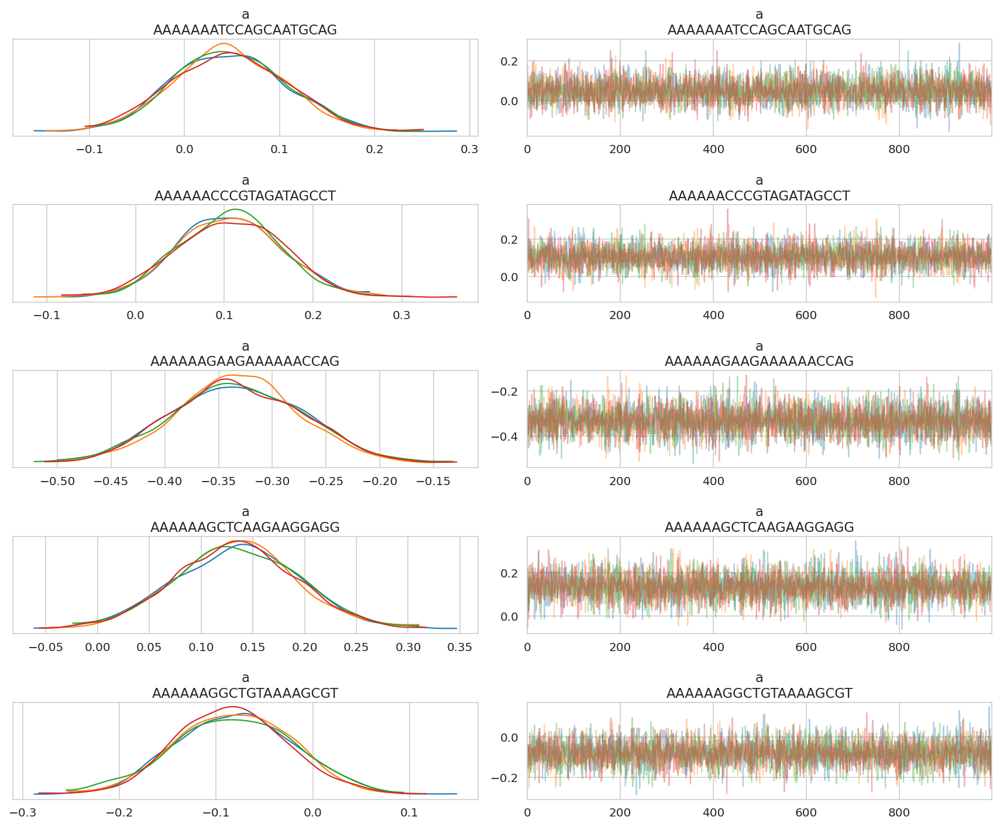

In [35]:
sgrnas_sample = trace.posterior.coords["sgrna"].values[:5]

az.plot_trace(trace, var_names="a", coords={"sgrna": sgrnas_sample}, compact=False)
plt.tight_layout()
plt.show()

🧬 target gene: *KRAS*

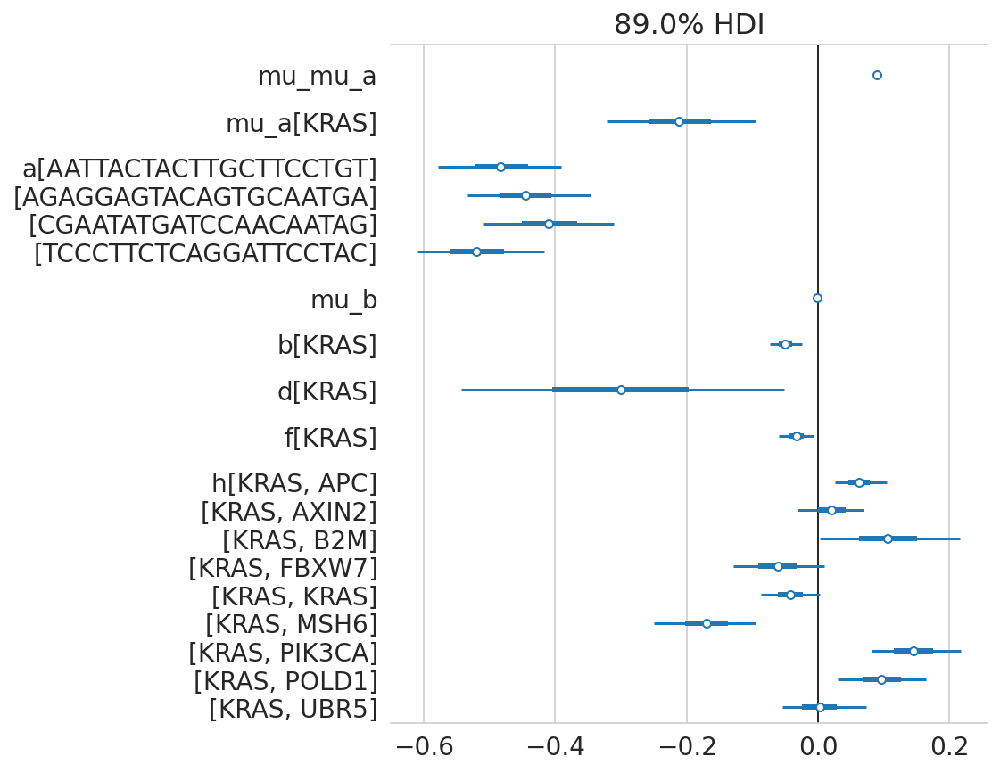

🧬 target gene: *BRAF*

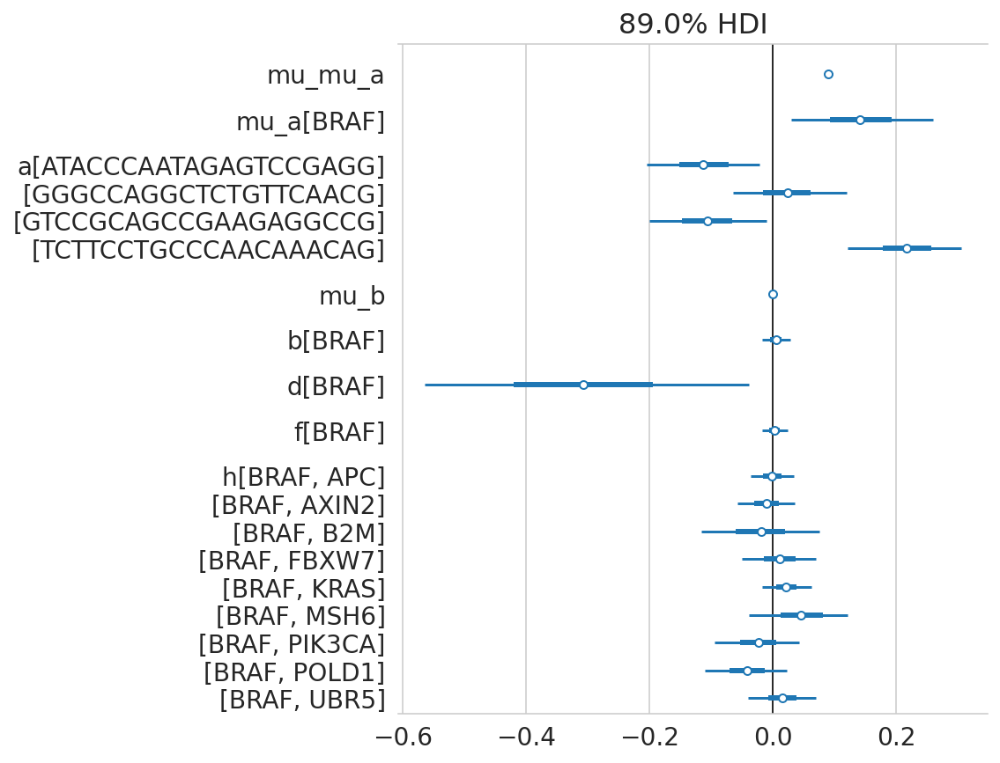

🧬 target gene: *CTNNB1*

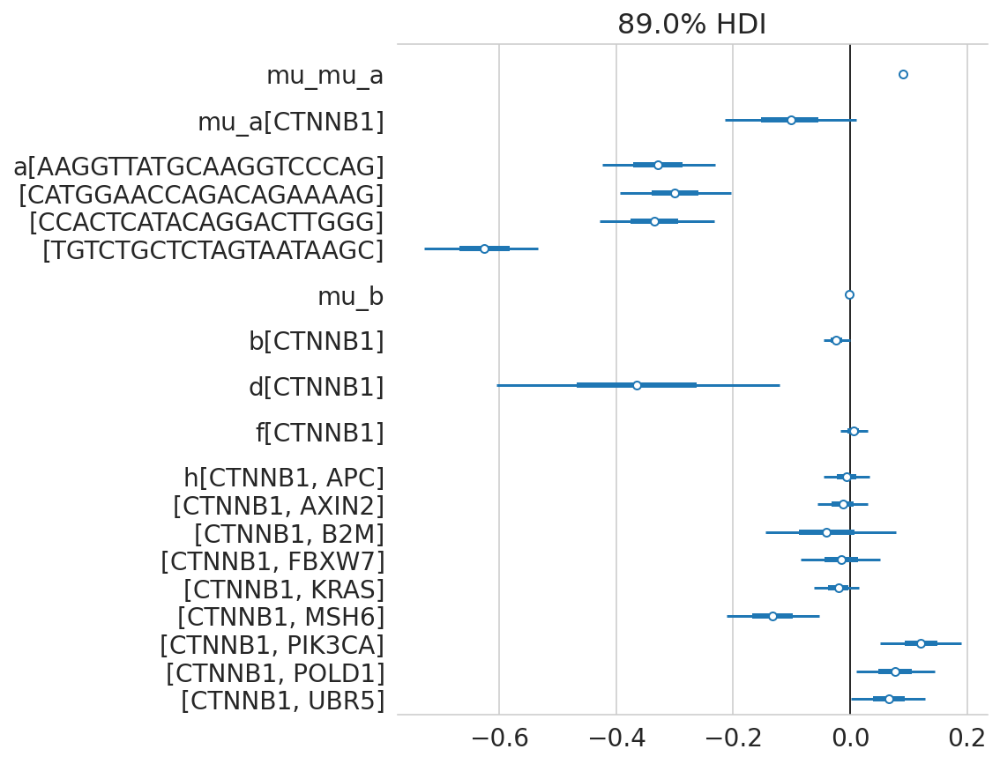

🧬 target gene: *TP53*

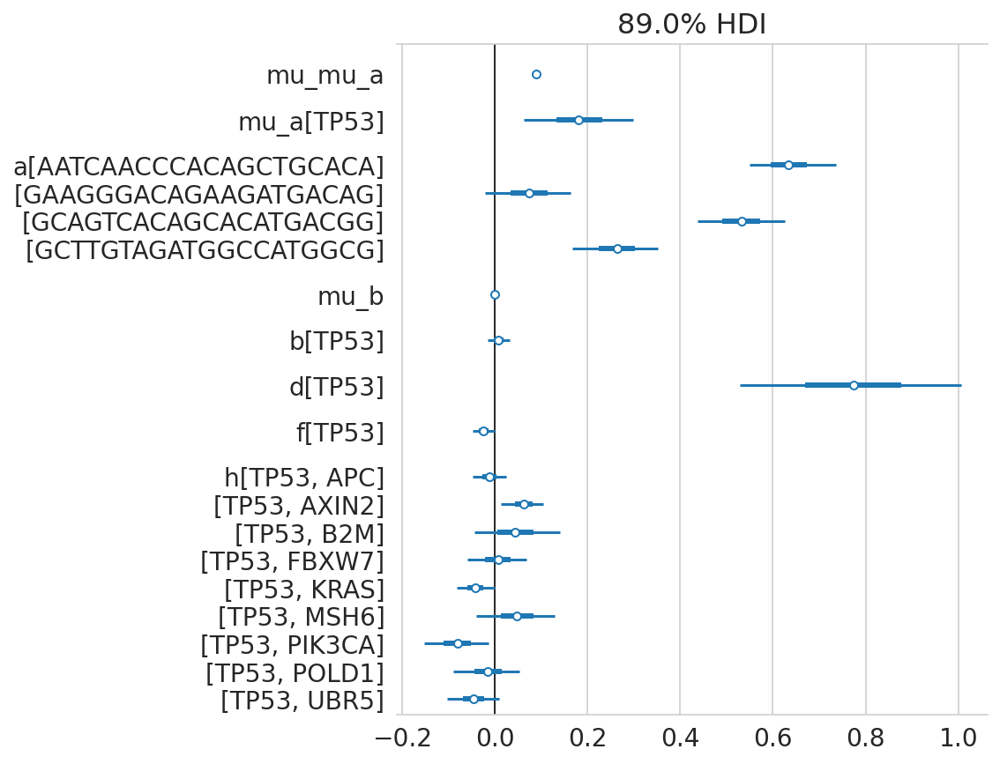

🧬 target gene: *PTEN*

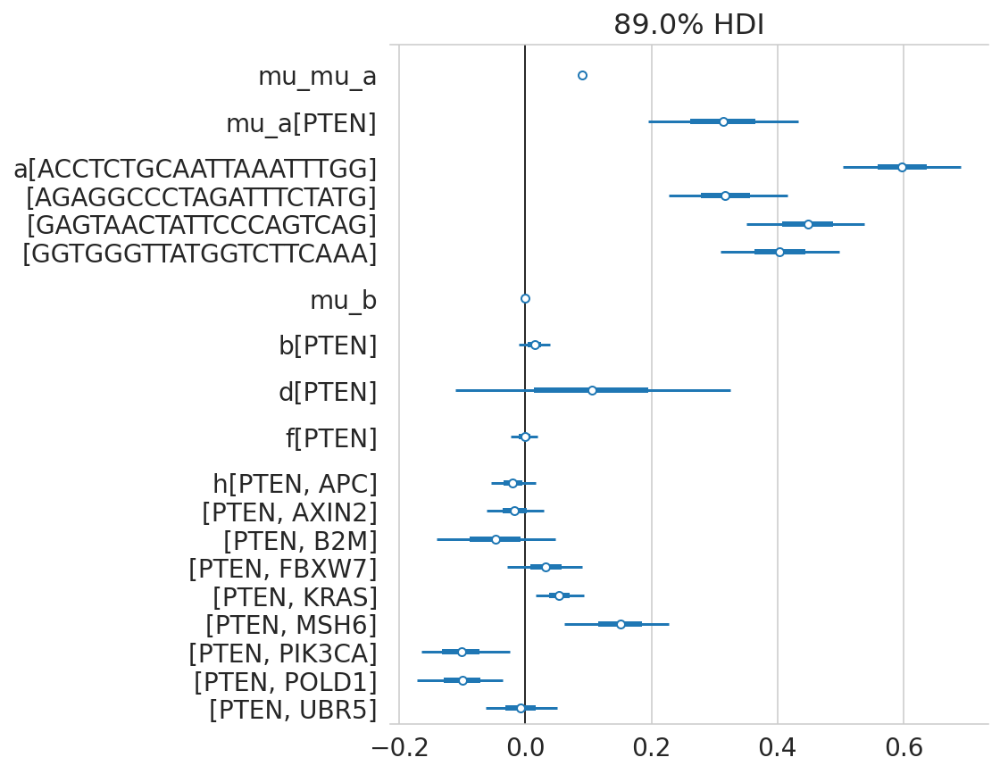

In [36]:
example_genes = ["KRAS", "BRAF", "CTNNB1", "TP53", "PTEN"]
for example_gene in example_genes:
    display(Markdown(f"🧬 target gene: *{example_gene}*"))
    example_gene_sgrna = sgrna_to_gene_map.query(f"hugo_symbol == '{example_gene}'")[
        "sgrna"
    ].tolist()
    axes = az.plot_forest(
        trace,
        var_names=[
            "mu_mu_a",
            "mu_a",
            "a",
            "mu_b",
            "b",
            "d",
            "f",
            "h",
        ],
        coords={"gene": [example_gene], "sgrna": example_gene_sgrna},
        combined=True,
        figsize=(6, 7),
    )
    axes[0].axvline(0, color="k", lw=0.8, zorder=1)
    plt.show()

/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/arviz/plots/backends/matplotlib/pairplot.py:232: UserWarning: rcParams['plot.max_subplots'] (64) is smaller than the number of resulting pair plots with these variables, generating only a 10x10 grid
  warnings.warn(


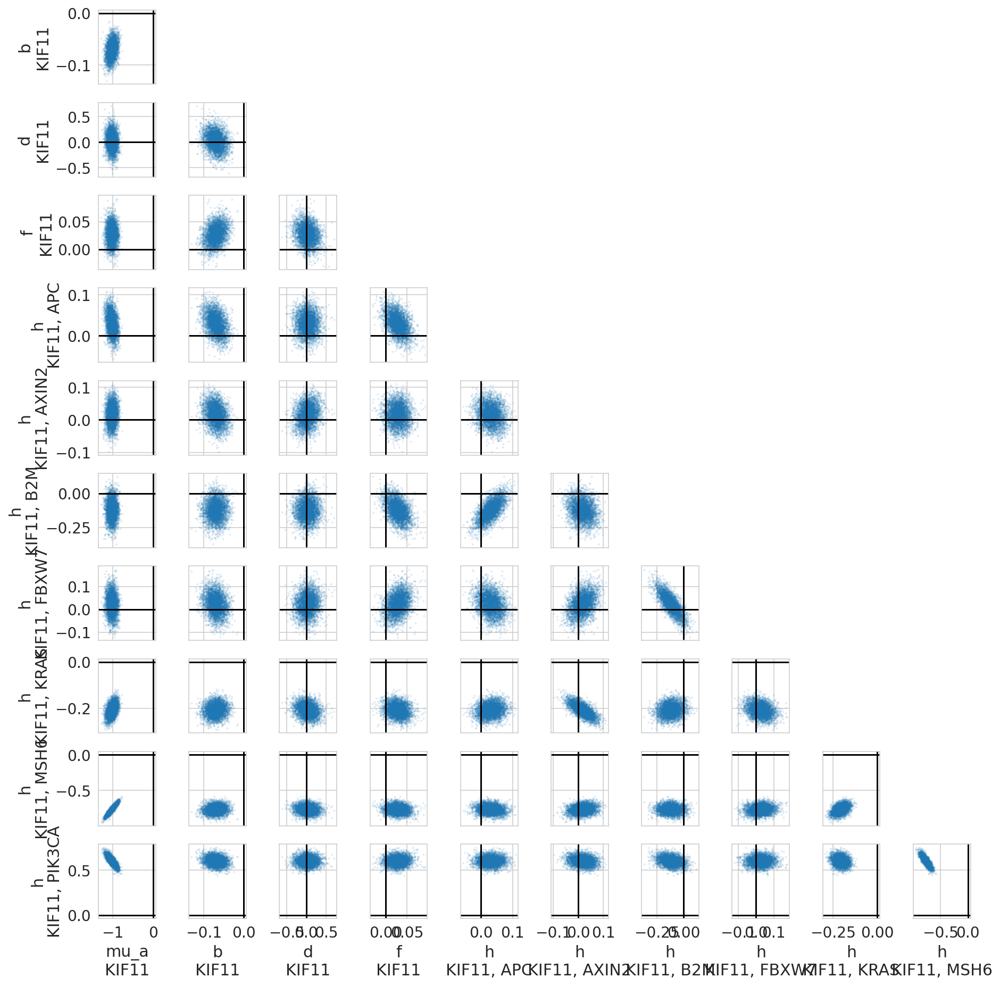

/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/arviz/plots/backends/matplotlib/pairplot.py:232: UserWarning: rcParams['plot.max_subplots'] (64) is smaller than the number of resulting pair plots with these variables, generating only a 10x10 grid
  warnings.warn(


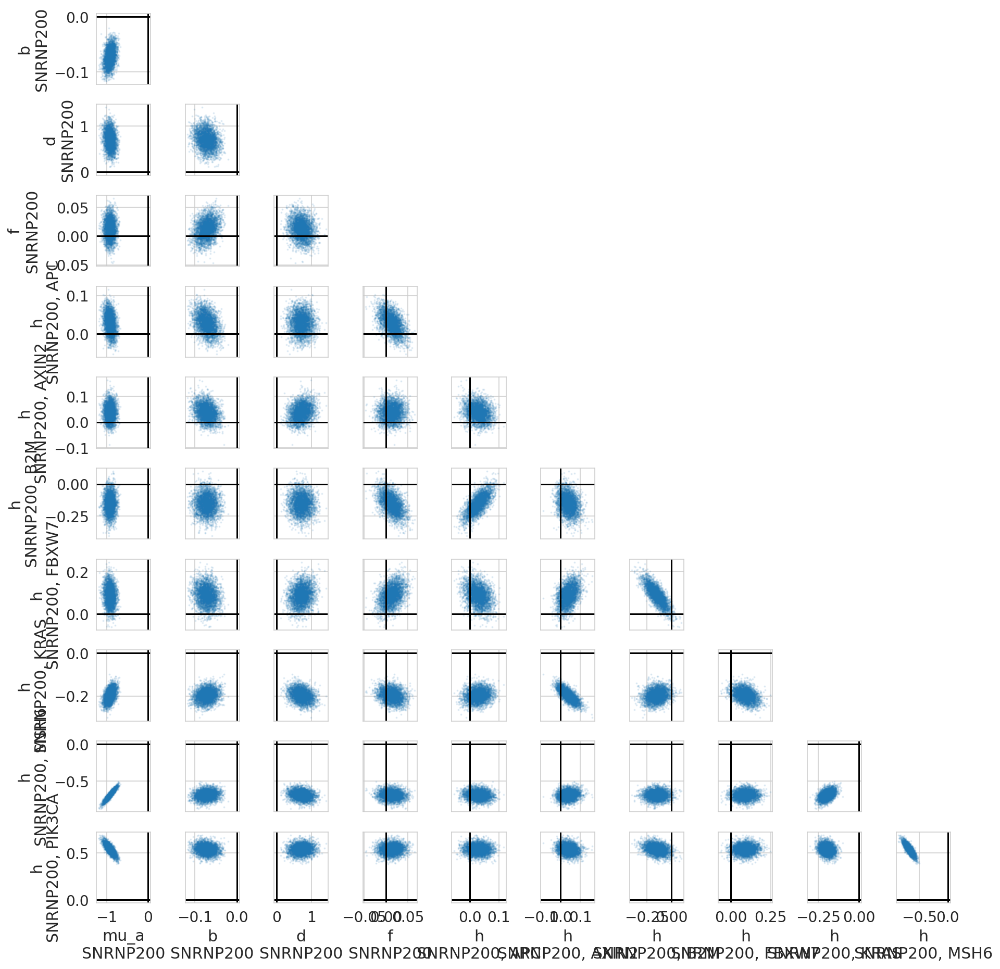

In [37]:
with az.rc_context({"plot.max_subplots": 64}):
    for gene in ["KIF11", "SNRNP200"]:
        axes = az.plot_pair(
            trace,
            var_names=["mu_a", "b", "d", "f", "h"],
            coords={"gene": [gene]},
            figsize=(13, 13),
            scatter_kwargs={"alpha": 0.1, "markersize": 2},
        )
        for ax in axes.flatten():
            ax.axhline(0, color="k")
            ax.axvline(0, color="k")
        plt.tight_layout()
        plt.show()

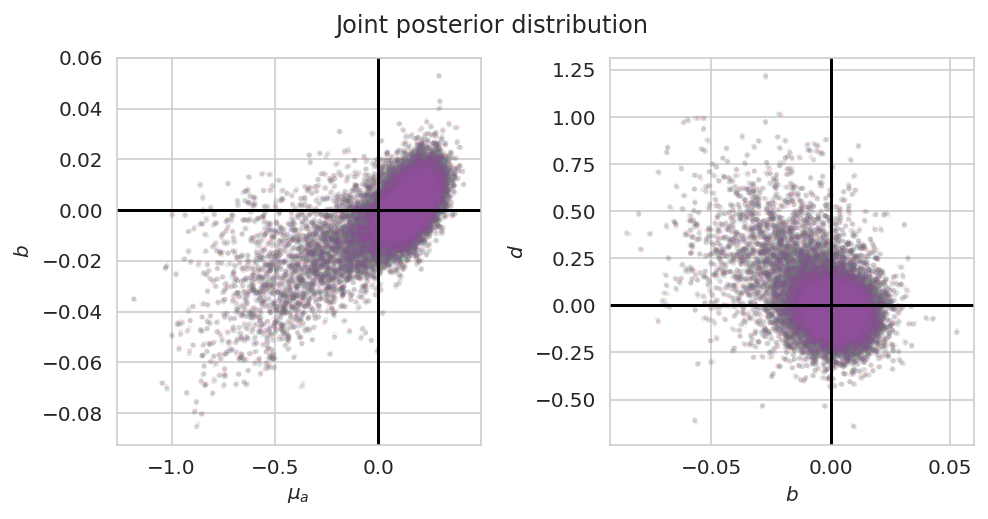

In [38]:
def _get_average_per_chain(trace: az.InferenceData, var_name: str) -> pd.DataFrame:
    return (
        trace.posterior[var_name]
        .mean(axis=(1))
        .to_dataframe()
        .reset_index()
        .astype({"chain": str})
    )


mu_a_post_avg = _get_average_per_chain(trace, "mu_a")
b_post_avg = _get_average_per_chain(trace, "b")
d_post_avg = _get_average_per_chain(trace, "d")

gene_post_avg = mu_a_post_avg.merge(b_post_avg, on=["chain", "gene"]).merge(
    d_post_avg, on=["chain", "gene"]
)


fig, axes = plt.subplots(1, 2, squeeze=True, figsize=(7, 3.5))

ax = axes[0]
sns.scatterplot(
    data=gene_post_avg,
    x="mu_a",
    y="b",
    hue="chain",
    palette="Set1",
    alpha=0.1,
    edgecolor=None,
    s=5,
    ax=ax,
)
ax.set_xlabel(r"$\mu_a$")
ax.set_ylabel(r"$b$")


ax = axes[1]
sns.scatterplot(
    data=gene_post_avg,
    x="b",
    y="d",
    hue="chain",
    palette="Set1",
    alpha=0.1,
    edgecolor=None,
    s=5,
    ax=ax,
)
ax.set_xlabel(r"$b$")
ax.set_ylabel(r"$d$")

for ax in axes.flatten():
    ax.axhline(color="k")
    ax.axvline(color="k")
    ax.get_legend().remove()


fig.tight_layout()
fig.suptitle("Joint posterior distribution", va="bottom")

plt.show()

In [39]:
tp53_muts = (
    valid_crc_data.query("hugo_symbol == 'TP53'")[["depmap_id", "is_mutated"]]
    .copy()
    .drop_duplicates()
    .rename(columns={"is_mutated": "TP53 mut."})
    .reset_index(drop=True)
)

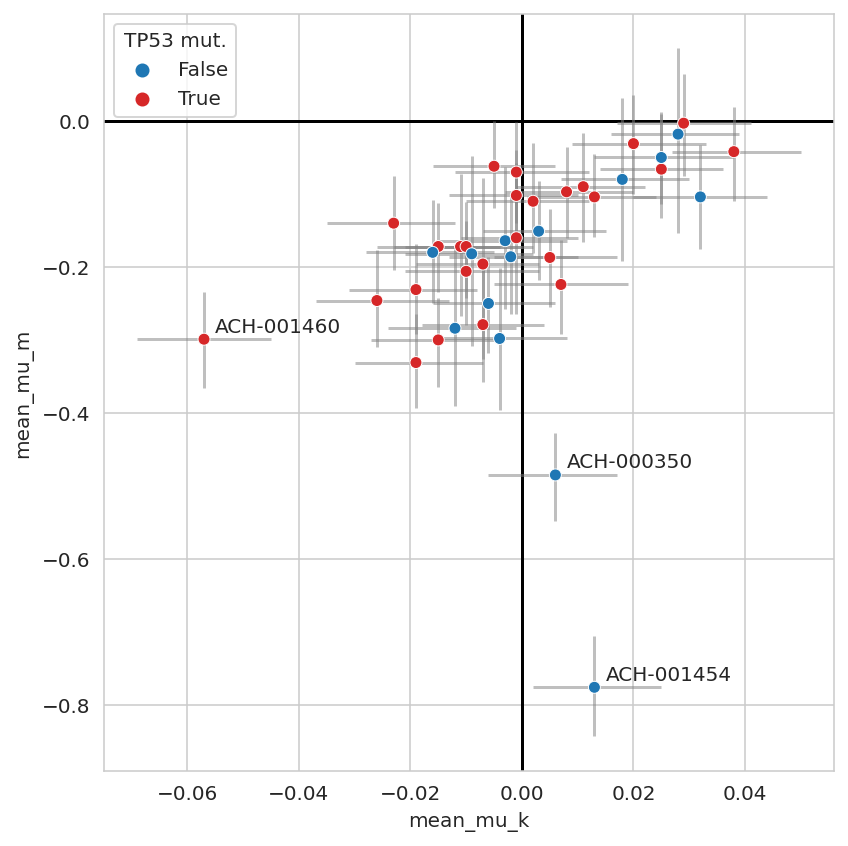

In [47]:
cell_line_vars = ["mu_k", "mu_m"]
cell_line_effects = (
    az.summary(trace, var_names=cell_line_vars, kind="stats")
    .pipe(extract_coords_param_names, names=["depmap_id"])
    .assign(var_name=lambda d: [x.split("[")[0] for x in d.index.values])
    .pivot_wider(
        index="depmap_id",
        names_from="var_name",
        values_from=["mean", "hdi_5.5%", "hdi_94.5%"],
    )
    .merge(tp53_muts, on="depmap_id")
)

fig, ax = plt.subplots(figsize=(6, 6))

ax.axhline(0, color="k", zorder=1)
ax.axvline(0, color="k", zorder=1)

ax.vlines(
    x=cell_line_effects["mean_mu_k"],
    ymin=cell_line_effects["hdi_5.5%_mu_m"],
    ymax=cell_line_effects["hdi_94.5%_mu_m"],
    alpha=0.5,
    color="gray",
)
ax.hlines(
    y=cell_line_effects["mean_mu_m"],
    xmin=cell_line_effects["hdi_5.5%_mu_k"],
    xmax=cell_line_effects["hdi_94.5%_mu_k"],
    alpha=0.5,
    color="gray",
)
mut_pal = {True: "tab:red", False: "tab:blue"}
sns.scatterplot(
    data=cell_line_effects,
    x="mean_mu_k",
    y="mean_mu_m",
    hue="TP53 mut.",
    palette=mut_pal,
    ax=ax,
    zorder=10,
)

annotate_df = cell_line_effects.query("mean_mu_k < -0.05 or mean_mu_m < -0.4")
for _, info in annotate_df.iterrows():
    ax.text(
        x=info["mean_mu_k"] + 0.002, y=info["mean_mu_m"] + 0.01, s=info["depmap_id"]
    )

sns.move_legend(ax, loc="upper left")
fig.tight_layout()
plt.show()

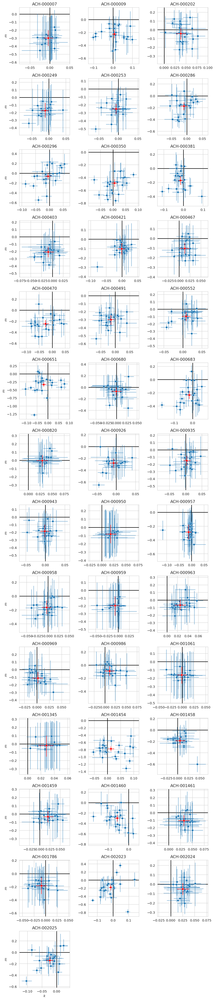

In [65]:
cell_chromosome_map = (
    valid_crc_data[["depmap_id", "sgrna_target_chr", "cell_chrom"]]
    .drop_duplicates()
    .sort_values("cell_chrom")
    .reset_index(drop=True)
)
chromosome_effect_post = (
    az.summary(trace, var_names=["k", "m"], kind="stats")
    .pipe(extract_coords_param_names, names="cell_chrom")
    .assign(var_name=lambda d: [p[0] for p in d.index.values])
    .merge(cell_chromosome_map, on="cell_chrom")
)

cell_effect_post = (
    az.summary(trace, var_names=["mu_k", "mu_m"], kind="stats")
    .pipe(extract_coords_param_names, names="depmap_id")
    .assign(var_name=lambda d: [p[:4] for p in d.index.values])
    .reset_index(drop=True)
    .pivot_wider(
        index="depmap_id",
        names_from="var_name",
        values_from=["mean", "hdi_5.5%", "hdi_94.5%"],
    )
)
ncells = chromosome_effect_post["depmap_id"].nunique()
ncols = 3
nrows = ceil(ncells / 3)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(9, nrows * 3))
for ax, (cell, data_c) in zip(
    axes.flatten(), chromosome_effect_post.groupby("depmap_id")
):
    plot_df = data_c.pivot_wider(
        index="sgrna_target_chr",
        names_from="var_name",
        values_from=["mean", "hdi_5.5%", "hdi_94.5%"],
    )
    cell_eff = (
        cell_effect_post.copy().query(f"depmap_id == '{cell}'").reset_index(drop=True)
    )

    ax.axhline(0, color="k", zorder=1)
    ax.axvline(0, color="k", zorder=1)

    ax.vlines(
        x=plot_df["mean_k"],
        ymin=plot_df["hdi_5.5%_m"],
        ymax=plot_df["hdi_94.5%_m"],
        alpha=0.5,
        zorder=5,
    )
    ax.hlines(
        y=plot_df["mean_m"],
        xmin=plot_df["hdi_5.5%_k"],
        xmax=plot_df["hdi_94.5%_k"],
        alpha=0.5,
        zorder=5,
    )
    sns.scatterplot(data=plot_df, x="mean_k", y="mean_m", ax=ax, zorder=10)

    ax.vlines(
        x=cell_eff["mean_mu_k"],
        ymin=cell_eff["hdi_5.5%_mu_m"],
        ymax=cell_eff["hdi_94.5%_mu_m"],
        alpha=0.8,
        zorder=15,
        color="red",
    )
    ax.hlines(
        y=cell_eff["mean_mu_m"],
        xmin=cell_eff["hdi_5.5%_mu_k"],
        xmax=cell_eff["hdi_94.5%_mu_k"],
        alpha=0.8,
        zorder=15,
        color="red",
    )
    sns.scatterplot(
        data=cell_eff, x="mean_mu_k", y="mean_mu_m", ax=ax, zorder=20, color="red"
    )
    ax.set_title(cell)
    ax.set_xlabel(None)
    ax.set_ylabel(None)

for ax in axes[-1, :]:
    ax.set_xlabel("$k$")
for ax in axes[:, 0]:
    ax.set_ylabel("$m$")
for ax in axes.flatten()[ncells:]:
    ax.axis("off")

fig.tight_layout()
plt.show()

In [48]:
genes_var_names = ["mu_a", "b", "d", "f"]
genes_var_names += [f"h[{g}]" for g in trace.posterior.coords["cancer_gene"].values]
gene_corr_post = (
    az.summary(trace, "genes_chol_cov_corr", kind="stats")
    .pipe(extract_coords_param_names, names=["d1", "d2"])
    .astype({"d1": int, "d2": int})
    .assign(
        p1=lambda d: [genes_var_names[i] for i in d["d1"]],
        p2=lambda d: [genes_var_names[i] for i in d["d2"]],
    )
    .assign(
        p1=lambda d: pd.Categorical(d["p1"], categories=d["p1"].unique(), ordered=True)
    )
    .assign(
        p2=lambda d: pd.Categorical(
            d["p2"], categories=d["p1"].cat.categories, ordered=True
        )
    )
)

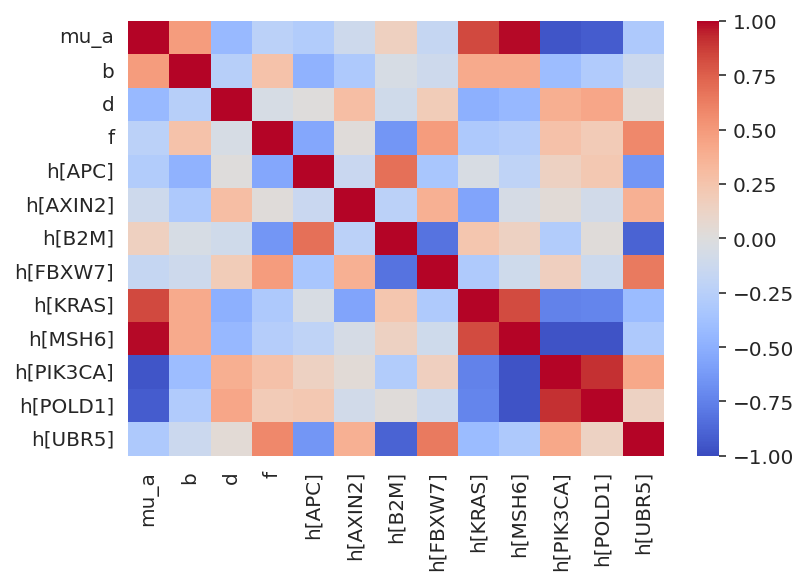

In [49]:
plot_df = gene_corr_post.pivot_wider("p1", "p2", "mean").set_index("p1")
ax = sns.heatmap(
    plot_df,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
)
ax.set_ylabel(None)
plt.show()

In [50]:
cells_var_names = ["mu_k", "mu_m"]
cells_corr_post = (
    az.summary(trace, "cells_chol_cov_corr", kind="stats")
    .pipe(extract_coords_param_names, names=["d1", "d2"])
    .astype({"d1": int, "d2": int})
    .assign(
        p1=lambda d: [cells_var_names[i] for i in d["d1"]],
        p2=lambda d: [cells_var_names[i] for i in d["d2"]],
    )
    .assign(
        p1=lambda d: pd.Categorical(d["p1"], categories=d["p1"].unique(), ordered=True)
    )
    .assign(
        p2=lambda d: pd.Categorical(
            d["p2"], categories=d["p1"].cat.categories, ordered=True
        )
    )
)

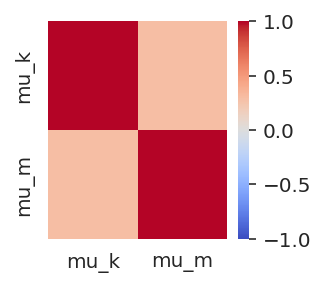

In [51]:
_, ax = plt.subplots(figsize=(2, 2))
plot_df = cells_corr_post.pivot_wider("p1", "p2", "mean").set_index("p1")
sns.heatmap(plot_df, cmap="coolwarm", vmin=-1, vmax=1, ax=ax)
ax.set_ylabel(None)
plt.show()

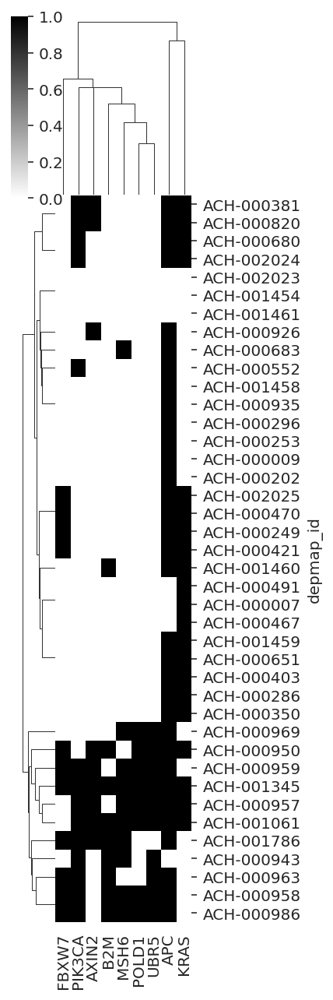

In [52]:
cancer_genes = trace.posterior.coords["cancer_gene"].values.tolist()
cancer_gene_mutants = (
    valid_crc_data.filter_column_isin("hugo_symbol", cancer_genes)[
        ["hugo_symbol", "depmap_id", "is_mutated"]
    ]
    .drop_duplicates()
    # .assign(is_mutated=lambda d: d["is_mutated"].map({True: "X", False: ""}))
    .sort_values(["hugo_symbol", "depmap_id"])
    .pivot_wider("depmap_id", names_from="hugo_symbol", values_from="is_mutated")
    .set_index("depmap_id")
)

sns.clustermap(
    cancer_gene_mutants, cmap="gray_r", xticklabels=1, yticklabels=1, figsize=(3, 9)
);

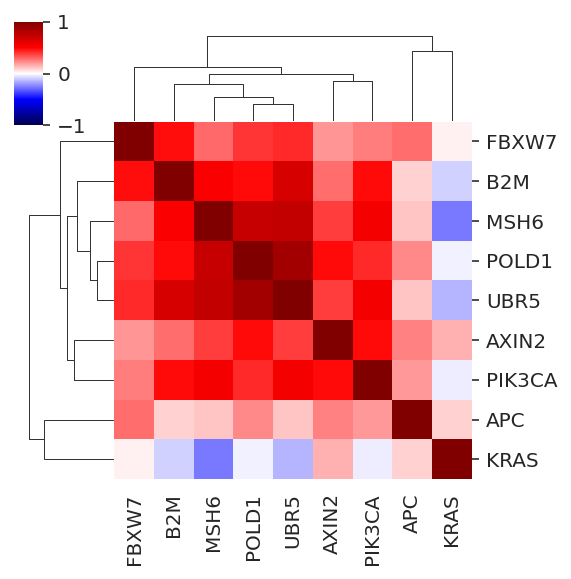

In [53]:
sns.clustermap(
    cancer_gene_mutants.corr(),
    cmap="seismic",
    center=0,
    vmin=-1,
    vmax=1,
    figsize=(4, 4),
);

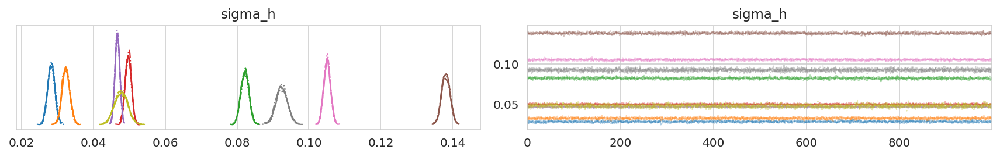

In [54]:
az.plot_trace(trace, var_names=["sigma_h"], compact=True)
plt.tight_layout()
plt.show()

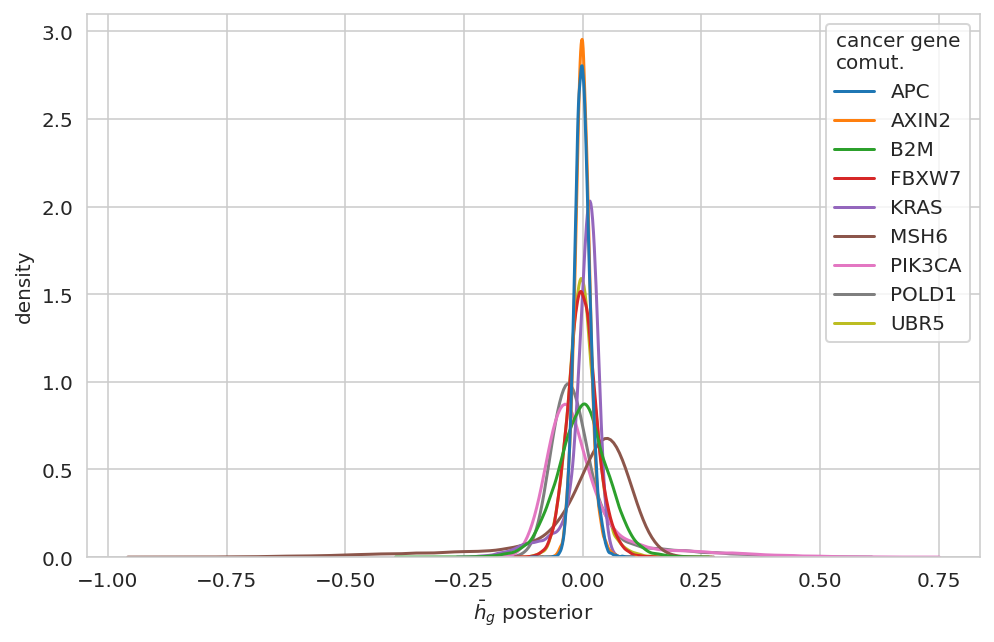

In [55]:
h_post_summary = (
    crc_post_summary.query("var_name == 'h'")
    .reset_index(drop=True)
    .pipe(
        extract_coords_param_names,
        names=["hugo_symbol", "cancer_gene"],
        col="parameter",
    )
)

_, ax = plt.subplots(figsize=(8, 5))
sns.kdeplot(data=h_post_summary, x="mean", hue="cancer_gene", ax=ax)
ax.set_xlabel(r"$\bar{h}_g$ posterior")
ax.set_ylabel("density")
ax.get_legend().set_title("cancer gene\ncomut.")
plt.show()

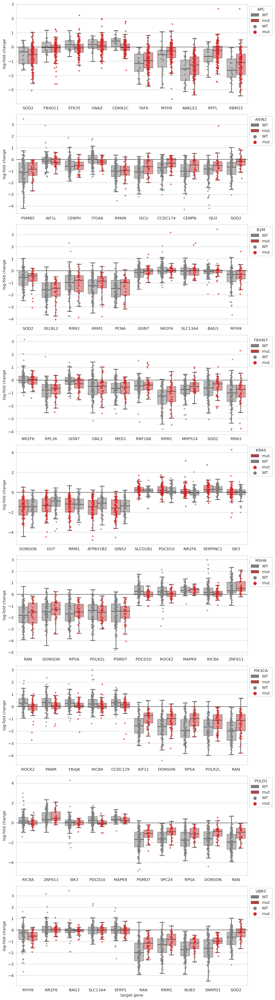

In [57]:
fig, axes = plt.subplots(
    len(cancer_genes), 1, squeeze=False, figsize=(10, len(cancer_genes) * 4)
)
for ax, cg in zip(axes.flatten(), cancer_genes):
    h_hits = (
        h_post_summary.filter_column_isin("cancer_gene", [cg])
        .sort_values("mean")
        .pipe(head_tail, n=5)["hugo_symbol"]
        .tolist()
    )

    h_hits_data = (
        valid_crc_data.filter_column_isin("hugo_symbol", h_hits)
        .merge(cancer_gene_mutants.reset_index(), on="depmap_id")
        .reset_index()
        .astype({"hugo_symbol": str})
        .assign(
            hugo_symbol=lambda d: pd.Categorical(d["hugo_symbol"], categories=h_hits),
            _cg_mut=lambda d: d[cg].map({True: "mut.", False: "WT"}),
        )
    )
    ax.axhline(0, color="k", lw=0.8)
    cg_mut_pal = {"mut.": "tab:red", "WT": "gray"}
    boxes = sns.boxplot(
        data=h_hits_data,
        x="hugo_symbol",
        y="lfc",
        hue="_cg_mut",
        palette=cg_mut_pal,
        ax=ax,
        showfliers=False,
        boxprops={"alpha": 0.5},
    )
    points = sns.stripplot(
        data=h_hits_data,
        x="hugo_symbol",
        y="lfc",
        hue="_cg_mut",
        dodge=True,
        palette=cg_mut_pal,
        s=4,
        alpha=0.7,
        ax=ax,
    )
    sns.move_legend(ax, loc="upper left", bbox_to_anchor=(1, 1), title=cg)
    ax.set_xlabel(None)
    ax.set_ylabel("log-fold change")

axes[-1, 0].set_xlabel("target gene")
plt.tight_layout()
plt.show()

/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


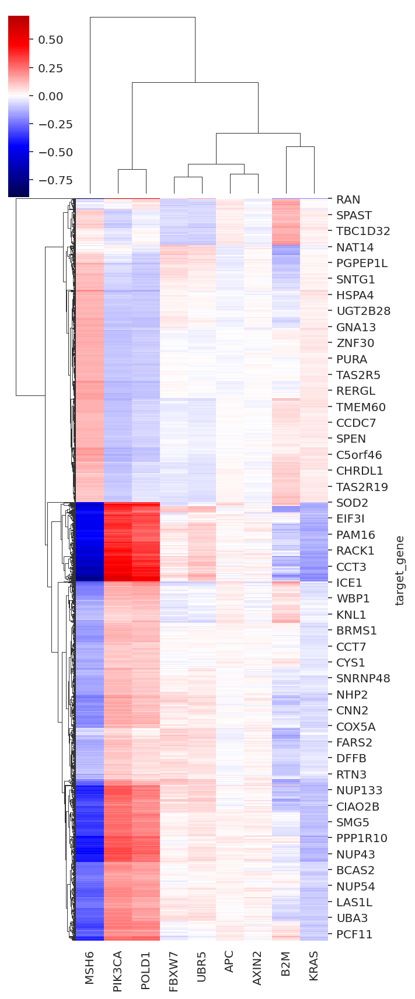

In [58]:
h_post_df = (
    crc_post_summary.query("var_name== 'h'")
    .reset_index(drop=True)
    .pipe(
        extract_coords_param_names,
        names=["target_gene", "cancer_gene"],
        col="parameter",
    )
    .pivot_wider("target_gene", names_from="cancer_gene", values_from="mean")
    .set_index("target_gene")
)

h_gene_var = h_post_df.values.var(axis=1)
idx = h_gene_var >= np.quantile(h_gene_var, q=0.8)
h_post_df_topvar = h_post_df.loc[idx, :]

sns.clustermap(h_post_df_topvar, cmap="seismic", center=0, figsize=(5, 12))
plt.show()

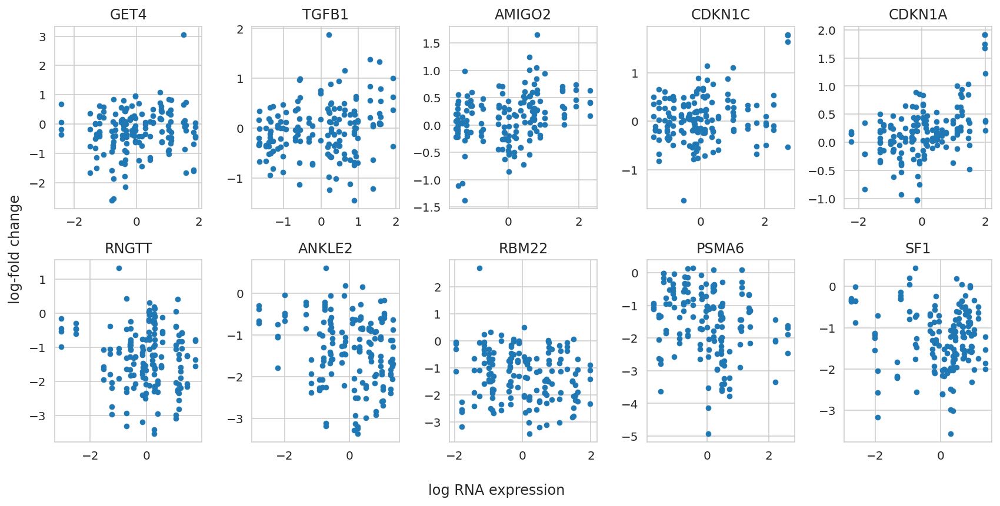

In [59]:
top_n = 5
top_b_hits = (
    crc_post_summary.query("var_name == 'b'")
    .sort_values("mean")
    .reset_index(drop=True)
    .pipe(extract_coords_param_names, names=["hugo_symbol"], col="parameter")
    .pipe(head_tail, n=top_n)
)

negative_b = top_b_hits["hugo_symbol"][:top_n].values
positive_b = top_b_hits["hugo_symbol"][top_n:].values


fig, axes = plt.subplots(2, top_n, figsize=(12, 6))

for i, genes in enumerate([positive_b, negative_b]):
    for j, gene in enumerate(genes):
        ax = axes[i, j]
        ax.set_title(gene)
        obs_data = valid_crc_data.query(f"hugo_symbol == '{gene}'")
        sns.scatterplot(
            data=obs_data, x="m_rna_gene", y="lfc", ax=ax, edgecolor=None, s=20
        )
        ax.set_xlabel(None)
        ax.set_ylabel(None)


fig.supxlabel("log RNA expression")
fig.supylabel("log-fold change")

fig.tight_layout()
plt.show()

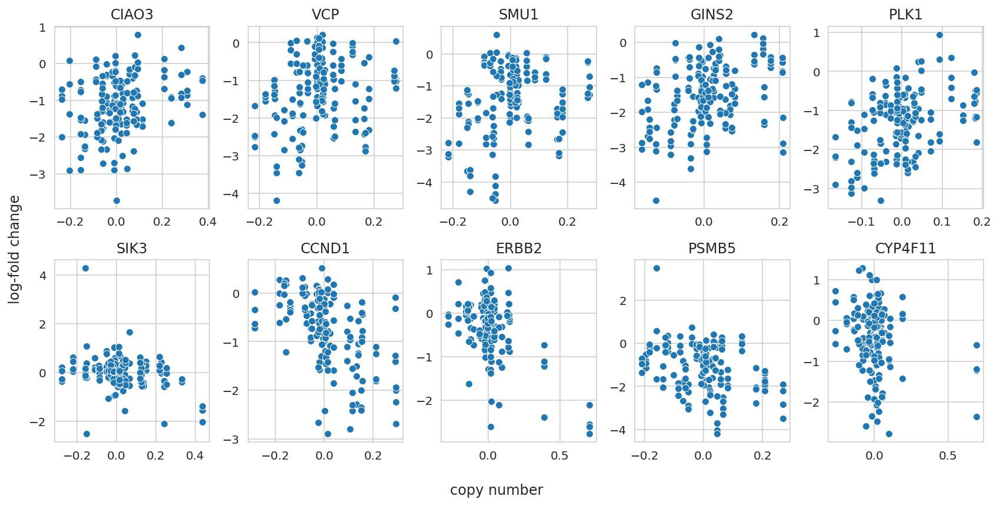

In [60]:
top_n = 5
top_d_hits = (
    crc_post_summary.query("var_name == 'd'")
    .sort_values("mean")
    .reset_index(drop=True)
    .pipe(extract_coords_param_names, names=["hugo_symbol"], col="parameter")
    .pipe(head_tail, n=top_n)
)

negative_d = top_d_hits["hugo_symbol"][:top_n].values
positive_d = top_d_hits["hugo_symbol"][top_n:].values


fig, axes = plt.subplots(2, top_n, figsize=(12, 6))

for i, genes in enumerate([positive_d, negative_d]):
    for j, gene in enumerate(genes):
        ax = axes[i, j]
        ax.set_title(gene)
        obs_data = valid_crc_data.query(f"hugo_symbol == '{gene}'")
        sns.scatterplot(data=obs_data, x="cn_gene", y="lfc", ax=ax)
        ax.set_xlabel(None)
        ax.set_ylabel(None)


fig.supxlabel("copy number")
fig.supylabel("log-fold change")
fig.tight_layout()
plt.show()

## PPC

In [61]:
n_examples = 40
n_chains, n_draws, n_data = trace.posterior_predictive["ct_final"].shape
ex_draws_idx = np.random.choice(
    np.arange(n_draws), size=n_examples // n_chains, replace=False
)
example_ppc_draws = trace.posterior_predictive["ct_final"][
    :, ex_draws_idx, :
].values.reshape(-1, n_data)
example_ppc_draws.shape

(40, 2842455)

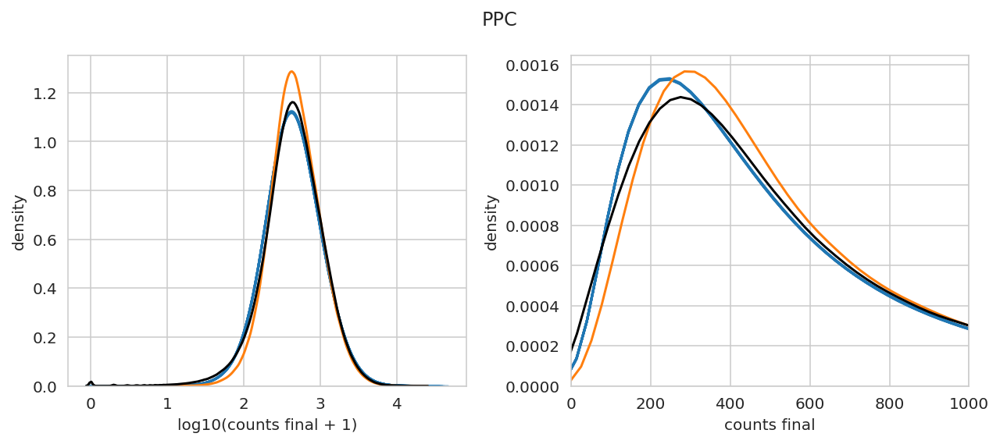

In [62]:
fig, axes = plt.subplots(ncols=2, figsize=(9, 4), sharex=False, sharey=False)
ax1 = axes[0]
ax2 = axes[1]

pp_avg = trace.posterior_predictive["ct_final"].mean(axis=(0, 1))

for i in range(example_ppc_draws.shape[0]):
    sns.kdeplot(
        x=np.log10(example_ppc_draws[i, :] + 1), alpha=0.2, color="tab:blue", ax=ax1
    )

sns.kdeplot(x=np.log10(pp_avg + 1), color="tab:orange", ax=ax1)
sns.kdeplot(x=np.log10(valid_crc_data["counts_final"] + 1), color="k", ax=ax1)
ax1.set_xlabel("log10(counts final + 1)")
ax1.set_ylabel("density")

x_max = 1000
x_cut = x_max * 5
for i in range(example_ppc_draws.shape[0]):
    x = example_ppc_draws[i, :]
    x = x[x < x_cut]
    sns.kdeplot(x=x, alpha=0.2, color="tab:blue", ax=ax2)

sns.kdeplot(x=pp_avg[pp_avg < x_cut], color="tab:orange", ax=ax2)
_obs = valid_crc_data["counts_final"].values
_obs = _obs[_obs < x_cut]
sns.kdeplot(x=_obs, color="k", ax=ax2)
ax2.set_xlabel("counts final")
ax2.set_ylabel("density")
ax2.set_xlim(0, x_max)

fig.suptitle("PPC")
fig.tight_layout()
plt.show()

---

## Session info

In [ ]:
notebook_toc = time()
print(f"execution time: {(notebook_toc - notebook_tic) / 60:.2f} minutes")

In [ ]:
%load_ext watermark
%watermark -d -u -v -iv -b -h -m